In [1]:
import sys
sys.path.append('../')

import pandas as pd
import numpy as np
import re
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, balanced_accuracy_score, roc_auc_score
from sklearn.model_selection import RandomizedSearchCV
from imblearn.over_sampling import SMOTE, KMeansSMOTE
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="white", color_codes=True)
from utils import load_data, feature_selection, plot_graphs, preprocessing
from scipy.signal import savgol_filter
from models import train
import shap
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from probatus.feature_elimination import ShapRFECV

from shaphypetune import BoostSearch, BoostBoruta, BoostRFE
from lightgbm import LGBMClassifier
import warnings
warnings.simplefilter(action='ignore')

In [2]:
def show_abs_values(df, column):
    df_values = pd.DataFrame()
    df_values["values"] = df[column].value_counts()
    df_values["%"] = df[column].value_counts(normalize=True) * 100
    return df_values.round(2)


def load_dataset(path, sheet):
    valid_classes = ['CBC', 'CEC', 'MEL', 'ACK', 'SEK', 'NEV', 'CEC/CBC']
    df = pd.read_excel(path, sheet_name=sheet) \
           .iloc[:, 5:-4]
    return df.loc[df['Classe'].isin(valid_classes)]


def fit_model(model, X, y, method):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                        random_state=1066, stratify=y)

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('ACCURACY:', round(accuracy_score(y_test, pred), 3))
    print('BALANCED ACCURACY', round(balanced_accuracy_score(y_test, pred), 3))
    print('F-SCORE:', round(f1_score(y_test, pred), 3))
    print('PRECISION:', round(precision_score(y_test, pred), 3))
    print('RECALL:', round(recall_score(y_test, pred), 3))
    print('AUC ROC:', round(roc_auc_score(y_test, pred), 3))

    df_metrics = pd.DataFrame(index=['ACCURACY', 'BALANCED ACCURACY', 
        'F-SCORE', 'PRECISION', 'RECALL', 'AUC ROC'], data={method: [round(accuracy_score(y_test, pred), 3), 
                                                                    round(balanced_accuracy_score(y_test, pred), 3),
                                                                    round(f1_score(y_test, pred), 3),
                                                                    round(precision_score(y_test, pred), 3),
                                                                    round(recall_score(y_test, pred), 3),
                                                                    round(roc_auc_score(y_test, pred), 3)]})
    return model, df_metrics


def fit_model_no_train_test(model, X_train, X_test, y_train, y_test, method):

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('ACCURACY:', round(accuracy_score(y_test, pred), 3))
    print('BALANCED ACCURACY', round(balanced_accuracy_score(y_test, pred), 3))
    print('F-SCORE:', round(f1_score(y_test, pred), 3))
    print('PRECISION:', round(precision_score(y_test, pred), 3))
    print('RECALL:', round(recall_score(y_test, pred), 3))
    print('AUC ROC:', round(roc_auc_score(y_test, pred), 3))

    df_metrics = pd.DataFrame(index=['ACCURACY', 'BALANCED ACCURACY', 
        'F-SCORE', 'PRECISION', 'RECALL', 'AUC ROC'], data={method: [round(accuracy_score(y_test, pred), 3), 
                                                                    round(balanced_accuracy_score(y_test, pred), 3),
                                                                    round(f1_score(y_test, pred), 3),
                                                                    round(precision_score(y_test, pred), 3),
                                                                    round(recall_score(y_test, pred), 3),
                                                                    round(roc_auc_score(y_test, pred), 3)]})
    return model, df_metrics


def fit_model_multiclass_no_train_test(model, X_train, X_test, y_train, y_test, method):

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('ACCURACY:', round(accuracy_score(y_test, pred), 3))
    print('BALANCED ACCURACY', round(balanced_accuracy_score(y_test, pred), 3))
    print('F-SCORE:', round(f1_score(y_test, pred, average='macro'), 3))
    print('PRECISION:', round(precision_score(y_test, pred, average='macro'), 3))
    print('RECALL:', round(recall_score(y_test, pred, average='macro'), 3))

    df_metrics = pd.DataFrame(index=['ACCURACY', 'BALANCED ACCURACY', 
        'F-SCORE', 'PRECISION', 'RECALL'], data={method: [round(accuracy_score(y_test, pred), 3), 
                                                        round(balanced_accuracy_score(y_test, pred), 3),
                                                        round(f1_score(y_test, pred, average='macro'), 3),
                                                        round(precision_score(y_test, pred, average='macro'), 3),
                                                        round(recall_score(y_test, pred, average='macro'), 3),
                                                        ]})
    return model, df_metrics


def generate_data(df, classe, label, n_data) -> pd.DataFrame:
    df_filter = df[df['classe'] == classe]
    X = df_filter.drop(['Sample', 'classe', 'label'], axis=1)
    rng = np.random.default_rng(1066)
    random_matrix = rng.random((n_data, 125))
    x_means = X.mean().to_numpy()
    x_stds = X.std().to_numpy()

    new_data = np.multiply(random_matrix, x_stds) + x_means
    new_data = pd.DataFrame(new_data, columns=X.columns)
    new_data['classe'] = classe
    new_data['label'] = label
    new_data['Sample'] = 'generated_' + str(classe)
    return pd.concat([df, new_data]).reset_index(drop=True)


In [3]:
# LOAD BASE

# df = (
#     pd.read_excel('Flavio.xlsx')
#     .set_index('Sample')
# )

# X = df.drop(['y'], axis=1)
# y = df['y'].to_numpy()

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
#                                                     random_state=1066, stratify=y)

# df_train = X_train.copy()
# df_train['y'] = y_train
# df_train.to_excel('treinamento-raw.xlsx')

# df_test = X_test.copy()
# df_test['y'] = y_test
# df_test.to_excel('teste-raw.xlsx')

In [3]:
df_train = pd.read_excel('treinamento-raw.xlsx').set_index('Sample')
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-raw.xlsx').set_index('Sample')
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

df = pd.concat([df_train, df_test])

print(df_train.shape, df_test.shape)

(535, 126) (179, 126)


In [3]:
df_train = pd.read_excel('treinamento-smote.xlsx', index_col=0)
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-raw.xlsx', index_col=0)
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

df = pd.concat([df_train, df_test])

X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(
        X_snv_test, n_subsets=26, mode='stats')

print(df_train.shape, df_test.shape)

(768, 126) (179, 126)


In [21]:
sm = SMOTE(random_state=1066)

X_res, y_res = sm.fit_resample(X_train, y_train)

df_res = X_res.copy()
df_res['y'] = y_res
print(X_res.shape, y_res.shape)

df_res.to_excel('treinamento-smote.xlsx')
df_test.to_excel('teste-smote.xlsx')

(768, 125) (768,)


In [5]:
# LOAD DATA PAD

# df_2021 = pd.concat([
#     load_dataset(path="../data/PAD_2021.xlsx", sheet="SGPalha_2021"),
#     load_dataset(path="../data/PAD_2021.xlsx", sheet="SMJetiba_2021"),
#     load_dataset(path="../data/PAD_2021.xlsx", sheet="Itarana_2021"),
#     ]).iloc[:, :-3]


# df_2022 = pd.concat([
#     load_dataset(path="../data/PAD_2022.xlsx", sheet="SMJetiba_2022"),
#     load_dataset(path="../data/PAD_2022.xlsx", sheet="Vvalerio_2022"),
#     load_dataset(path="../data/PAD_2022.xlsx", sheet="Bguandu_2022"),
#     load_dataset(path="../data/PAD_2022.xlsx", sheet="Plaginha_2022"),
#     load_dataset(path="../data/PAD_2022.xlsx", sheet="LdaTerra_2022"),
#     ])

# df_full = pd.concat([df_2021, df_2022]).drop(['Amostras', 'Biopsias', 'COD'], axis=1)
# df_mean = df_full.groupby('Sample', as_index=False).mean()
# df_last = df_full.groupby('Sample', as_index=False).last()
# df_mean['classe'] = df_last['Classe']
# df_mean['label'] = ['maligno' if x in ['CBC', 'CEC', 'MEL', 'CEC/CBC'] else 'benigno' for x in df_mean['classe'].to_list()]
# df = df_mean \
#         .drop(['classe'], axis=1) \
#         .set_index('Sample')

# X = df.drop(['label'], axis=1)
# y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, 
#                                                     random_state=1066, stratify=y)
# df.to_csv('data_mean_labels.csv')

# print(len(X_train), len(X_test))

# df_train = X_train.copy()
# df_train['maligno'] = y_train
# df_train.to_excel('treinamento-raw.xlsx')

# df_test = X_test.copy()
# df_test['maligno'] = y_test
# df_test.to_excel('teste-raw.xlsx')

#### View Data

Show malignus class balance

In [4]:
X = df.drop(['y'], axis=1)
y = df['y'].to_numpy()
show_abs_values(df, 'y')

,values,%
0,512,71.71
1,202,28.29


Plot proportion

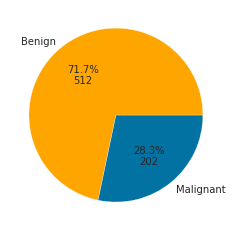

In [9]:
def func(pct, allvals):
    absolute = int(np.round(pct/100.*np.sum(allvals)))
    return "{:.1f}%\n{:d}".format(pct, absolute)

data = df.groupby('y').count()[908.100].to_list()

plt.pie(
    data,
    labels=['Benign', 'Malignant'],
    autopct=lambda pct: func(pct, data),
    colors=['orange', 'b']
)
plt.show()

Plot all the specters

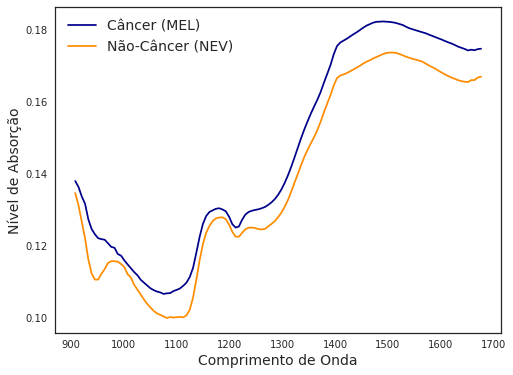

In [6]:
plt.style.use(['seaborn-white'])
spec = pd.read_excel('multilabel_data/teste-multiclasse.xlsx')
plt.figure(figsize=(8, 6))
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'MEL'])[0][2:], color='darkblue')
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'NEV'])[0][2:], color='darkorange')
plt.legend(["Câncer (MEL)", "Não-Câncer (NEV)"], prop={'size': 14})
plt.xlabel('Comprimento de Onda', fontsize=14)
plt.ylabel('Nível de Absorção', fontsize=14)
plt.savefig('spectrum_binary.jpg')

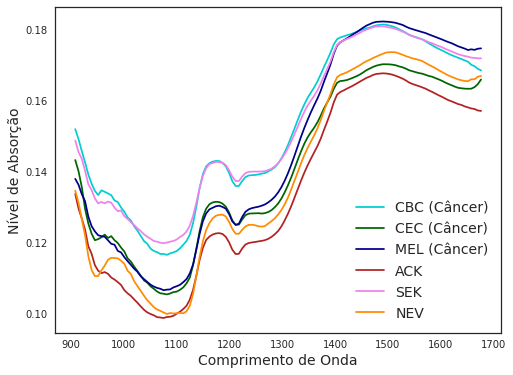

In [8]:
plt.style.use(['seaborn-white'])
spec = pd.read_excel('multilabel_data/teste-multiclasse.xlsx')
plt.figure(figsize=(8, 6))
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'CBC'])[0][2:], color='darkturquoise')
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'CEC'])[0][2:], color='darkgreen')
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'MEL'])[0][2:], color='darkblue')
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'ACK'])[0][2:], color='firebrick')
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'SEK'])[0][2:], color='violet')
plt.plot(spec.columns[2:], np.array(spec.loc[spec['Classe'] == 'NEV'])[0][2:], color='darkorange')
plt.legend(["CBC (Câncer)", "CEC (Câncer)", "MEL (Câncer)", "ACK", "SEK", "NEV"], prop={'size': 14})
plt.xlabel('Comprimento de Onda', fontsize=14)
plt.ylabel('Nível de Absorção', fontsize=14)
plt.savefig('spectrum_multiclass.jpg')

In [ ]:
def plot_mean_labels(df, column, figsize=(9, 6), title=" ", n_subsets=1):
    """
    Funcao para criar medias para cada doenca
    """
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(1, 1, 1)
    ax.set_title(title)
    df_means = df.groupby(column).mean()
    labels = df_means.index.to_list()
    range_spectrum = df_means.columns.to_numpy(dtype=np.float64)
    if n_subsets > 1:
        ymin = np.min(df_means.min().values)
        ymax = np.max(df_means.max().values)
        lines_location = [i[0] for i in np.array_split(np.array(range_spectrum), n_subsets)]
        ax.vlines(lines_location, ymin=ymin, ymax=ymax, color='r', alpha=0.4)
    for i in range(len(df_means)):
        sns.lineplot(range_spectrum, np.array(df_means)[i], label=labels[i])

    ax.set_xlabel('Wavelength')
    ax.set_ylabel('Absortion level')


plot_mean_labels(df_map, "y", n_subsets=26)

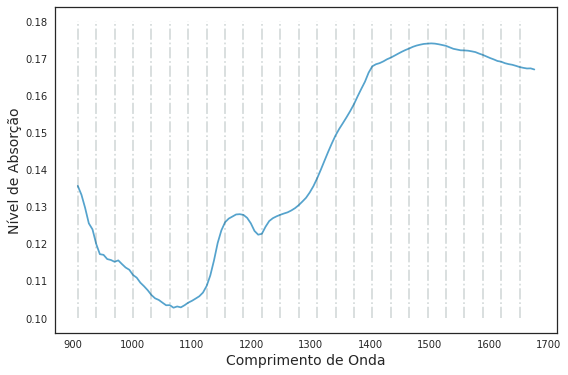

In [9]:
sns.set_style('white')
spec_x = spec.drop(['Classe', 'y'], axis=1)
range_spectrum = spec_x.columns.to_numpy(dtype=np.float64)
lines_location = [i[0] for i in np.array_split(np.array(range_spectrum), 25)]

ymin = np.min(spec_x.min().values)
ymax = np.max(spec_x.max().values)

fig = plt.figure(figsize=(9, 6))
ax = fig.add_subplot(1, 1, 1)
sns.lineplot(range_spectrum, np.array(spec_x)[100])
ax.vlines(lines_location, ymin=0.10, ymax=0.18, color='darkslategrey', linestyle='-.', alpha=0.2)
ax.set_xlabel('Comprimento de Onda', fontsize=14)
ax.set_ylabel('Nível de Absorção', fontsize=14)
plt.savefig('spectrum_windows.jpg')

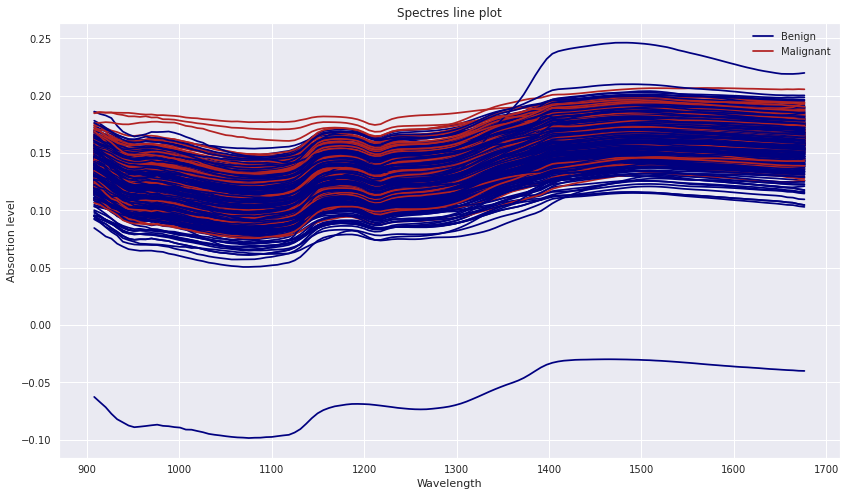

In [6]:
plot_graphs.plot_spectre(X, y)

In [114]:
len(y[y == 1])

202

In [17]:
X_preprocess = pd.DataFrame(preprocessing.SNV(X), columns=X.columns)
# X_preprocess = pd.DataFrame(preprocessing.create_emd(X, method='cubic', degree=1), columns=X.columns) # 'cubic', 'thin_plate', 'rbf'
df_preprocess = X_preprocess.copy()
df_preprocess['y'] = y
df_preprocess['classe'] = df_preprocess['y'].map({0: 'Non-Cancer', 1: 'Cancer'})
print(X_preprocess.shape)
# plot_graphs.plot_spectre(X_preprocess, y, title='Spectres line plot after SNV')

(714, 125)


#### Oversampling

In [7]:
show_abs_values(df, 'y')

,values,%
benigno,433,69.06
maligno,194,30.94


SMOTE

In [5]:
sm = SMOTE(random_state=1066)

X_res, y_res = sm.fit_resample(X_train, y_train)

df_res = X_res.copy()
df_res['y'] = y_res

show_abs_values(df_res, 'y')

,values,%
0,325,50.0
1,325,50.0


In [6]:
print('Resultados usando SMOTE')

model = CatBoostClassifier(verbose=0)

model, df_metric_smote = fit_model_no_train_test(model, X_res, X_test, y_res, y_test, 'SMOTE')

Resultados usando SMOTE
ACCURACY: 0.758
BALANCED ACCURACY 0.729
F-SCORE: 0.627
PRECISION: 0.604
RECALL: 0.653
AUC ROC: 0.729


KMeansSMOTE

In [7]:
ksm = KMeansSMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = ksm.fit_resample(X_train, y_train)

df_res = X_res.copy()
df_res['label'] = y_res

show_abs_values(df_res, 'label')

,values,%
1,326,50.08
0,325,49.92


In [8]:
print('Resultados usando KMeans SMOTE')

model = CatBoostClassifier(verbose=0)

model, df_metrics_kmeans_smote = fit_model_no_train_test(model, X_res, X_test, y_res, y_test, method='KMeansSMOTE')

Resultados usando KMeans SMOTE
ACCURACY: 0.764
BALANCED ACCURACY 0.7
F-SCORE: 0.584
PRECISION: 0.65
RECALL: 0.531
AUC ROC: 0.7


Dados sintéticos da Quimica

In [9]:
df_sintetic = load_dataset(path="../../data/PAD_2022.xlsx", sheet="Sintetica").drop(['Biopsias', 'COD'], axis=1)

df_sintetic['label'] = ['maligno' if x in ['CBC', 'CEC', 'MEL', 'CEC/CBC'] else 'benigno' for x in df_sintetic['Classe'].to_list()]
df_res = pd.concat([df, df_sintetic.drop(['Classe'], axis=1)])

show_abs_values(df_res, 'label')

,values,%
benigno,433,66.92
maligno,214,33.08


In [10]:
X = df_res.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df_res.label, drop_first=True)['maligno'].to_list()

model = CatBoostClassifier(verbose=0)

model, df_metrics_sintetic = fit_model(model, X, y, method='Sintetic')

ACCURACY: 0.747
BALANCED ACCURACY 0.69
F-SCORE: 0.577
PRECISION: 0.651
RECALL: 0.519
AUC ROC: 0.69


Com dados desbalanciados

In [5]:
X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()
print('Class imbalanced\n')

model = CatBoostClassifier(verbose=0)

model, df_metrics_imbalanced = fit_model(model, X, y, method='Imblanced')

NameError: name 'df' is not defined

Geração de dados aleatoria (multiplicar devio padrão e somar a media)

In [12]:
# generate
# 17 certatoses seborreica
# 65 carcinoma espinocelular
# 75 nevo
# 96 melanoma
# media + std * rand(0, 1)

df_train, df_test = train_test_split(df_mean, test_size=0.25, stratify=df_mean['classe'].to_list())

df_train_gen = generate_data(df_train, 'SEK', 'benigno', 17)
df_train_gen = generate_data(df_train_gen, 'NEV', 'benigno', 75)
df_train_gen = generate_data(df_train_gen, 'CEC', 'maligno', 65)
df_train_gen = generate_data(df_train_gen, 'MEL', 'maligno', 96)

show_abs_values(df_train_gen, 'label')

,values,%
benigno,416,57.54
maligno,307,42.46


In [13]:
X_train = df_train_gen.drop(['Sample', 'classe', 'label'], axis=1)
y_train = pd.get_dummies(df_train_gen.label, drop_first=True)['maligno'].to_list()

X_test = df_test.drop(['Sample', 'classe', 'label'], axis=1)
y_test = pd.get_dummies(df_test.label, drop_first=True)['maligno'].to_list()

print('Random Generated Data\n')

model = CatBoostClassifier(verbose=0)

model, df_metrics_random = fit_model_no_train_test(model, X_train, X_test, y_train, y_test, method='Random Generated Data')

Random Generated Data

ACCURACY: 0.822
BALANCED ACCURACY 0.761
F-SCORE: 0.674
PRECISION: 0.763
RECALL: 0.604
AUC ROC: 0.761


Criando junção

In [14]:
df_metrics_resemple = pd.concat([df_metrics_imbalanced, df_metric_smote, 
                                df_metrics_kmeans_smote, df_metrics_sintetic, 
                                df_metrics_random], axis=1)
df_metrics_resemple.style.background_gradient('Blues', axis=1)

,Imblanced,SMOTE,KMeansSMOTE,Sintetic,Random Generated Data
ACCURACY,0.752000,0.758000,0.764000,0.747000,0.822000
BALANCED ACCURACY,0.669000,0.729000,0.700000,0.690000,0.761000
F-SCORE,0.530000,0.627000,0.584000,0.577000,0.674000
PRECISION,0.647000,0.604000,0.650000,0.651000,0.763000
RECALL,0.449000,0.653000,0.531000,0.519000,0.604000
AUC ROC,0.669000,0.729000,0.700000,0.690000,0.761000


#### Analise do Dataset

In [11]:
df = pd.read_excel('Flavio.xlsx').drop(['Sample', 'Classe'], axis=1)

valid_classes = ['CBC', 'CEC', 'MEL', 'ACK', 'SEK', 'NEV']
df_classes = pd \
    .read_excel('Flavio.xlsx') \
    .drop(['Sample', 'y'], axis=1)
df_classes = df_classes \
    .loc[df_classes['Classe'].isin(valid_classes)]

df_classes['Classe'] = df_classes['Classe'] \
    .map({
        'ACK': 'Actinic Keratosis',
        'SEK': 'Seborrheic Keratosis',
        'NEV': 'Nevus',
        'MEL': 'Melanoma',
        'CBC': 'Basal Cell Carcinoma',
        'CEC': 'Squamous Cell Carcinoma'
    })

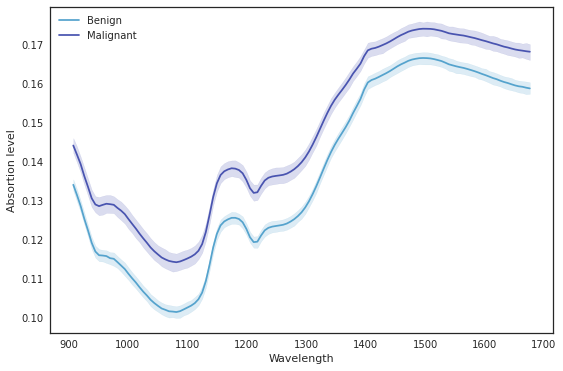

In [12]:
sns.set_style('white')

def plot_labels(df, column, figsize=(9, 6), title="Class mean plot"):
    fig = plt.figure(figsize=figsize)
    for col in df[column].value_counts().index:
        df_sub = df.loc[df[column] == col]
        tidy = df_sub.drop([column], axis=1).stack().reset_index().rename(columns=
            {"level_1": "Wavelength", 0: "Absortion level"})
        ax = sns.lineplot(data=tidy, x='Wavelength', y='Absortion level', label=col)

df_map = df.copy()
df_map['y'] = df_map['y'].map({2: 'Benign', 1: 'Malignant'})

plot_labels(df_map, 'y')

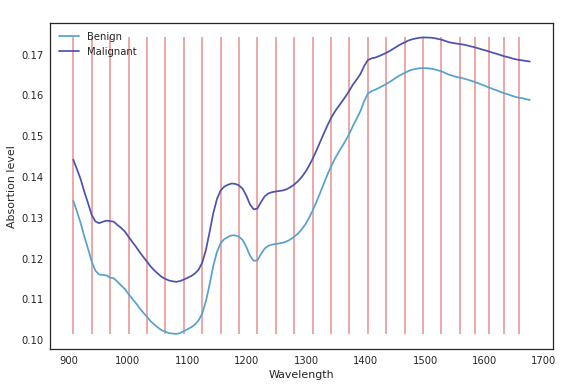

In [15]:
def plot_mean_labels(df, column, figsize=(9, 6), title=" ", n_subsets=1):
    """
    Funcao para criar medias para cada doenca
    """
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(1, 1, 1)
    ax.set_title(title)
    df_means = df.groupby(column).mean()
    labels = df_means.index.to_list()
    range_spectrum = df_means.columns.to_numpy(dtype=np.float64)
    if n_subsets > 1:
        ymin = np.min(df_means.min().values)
        ymax = np.max(df_means.max().values)
        lines_location = [i[0] for i in np.array_split(np.array(range_spectrum), n_subsets)]
        ax.vlines(lines_location, ymin=ymin, ymax=ymax, color='r', alpha=0.4)
    for i in range(len(df_means)):
        sns.lineplot(range_spectrum, np.array(df_means)[i], label=labels[i])

    ax.set_xlabel('Wavelength')
    ax.set_ylabel('Absortion level')


plot_mean_labels(df_map, "y", n_subsets=26)

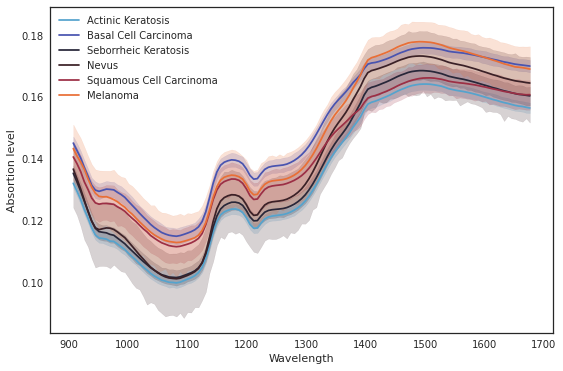

In [52]:
plot_labels(df_classes, 'Classe')

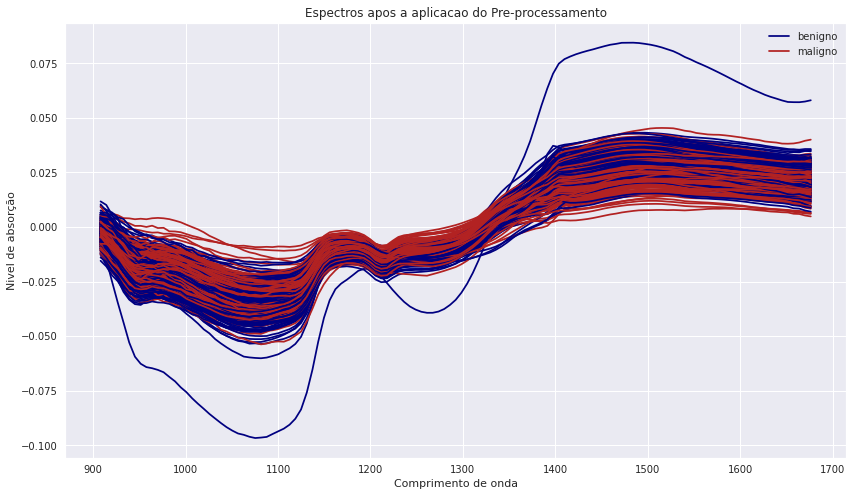

In [11]:
plot_graphs.plot_spectre(X_preprocess, y, title="Espectros apos a aplicacao do Pre-processamento")

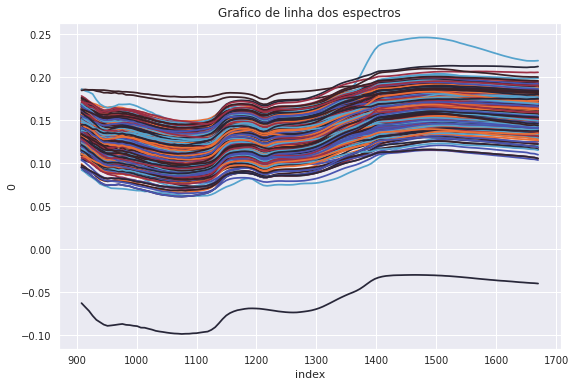

In [12]:
plot_graphs.plot_transpose(df)

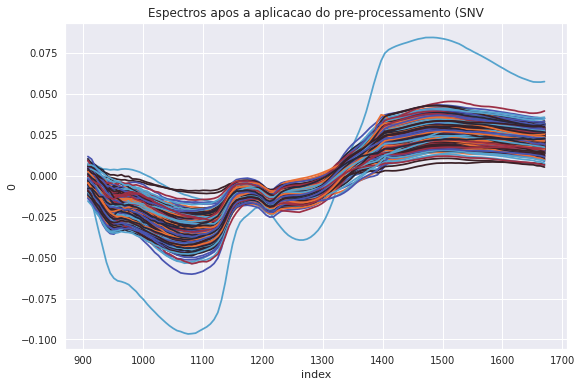

In [13]:
plot_graphs.plot_transpose(df_preprocess, title="Espectros apos a aplicacao do pre-processamento (SNV")

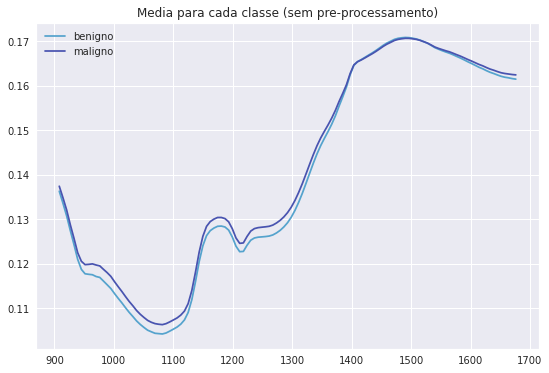

In [27]:
plot_graphs.plot_mean_labels(df, "label", title='Media para cada classe (sem pre-processamento)')

In [28]:
plot_graphs.plot_mean_labels(df_preprocess, "label", title='Media para cada classe (SNV)')

NameError: name 'df_preprocess' is not defined

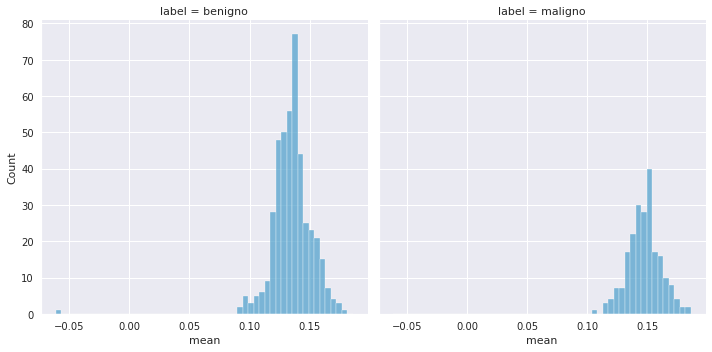

In [16]:
plot_graphs.plot_mean_dist(df, "label")

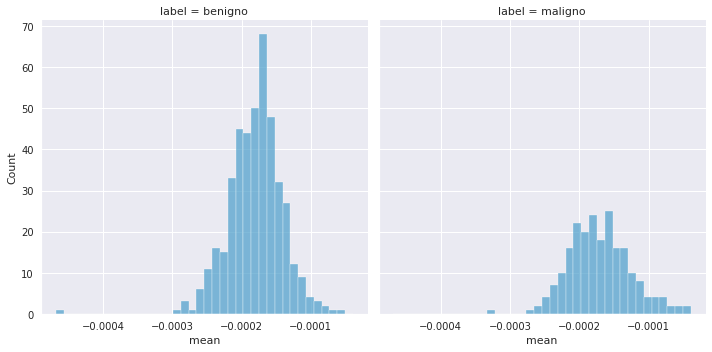

In [17]:
plot_graphs.plot_mean_dist(df_preprocess, "label")

,0,1,2,3,4,5,6,7,8,9,...,641,642,643,644,645,646,647,648,649,650
Sample,100918406320018-01,106704122920018-01,127276123910003-01,130117502960004-01,130117502960004-02,130117502960004-03,203476728030003-01,203476728030003-02,209395568840001-01,209395568840001-02,...,898050045908259-02,898050045908259-03,898050045908259-04,898050045908259-05,898050076902317-01,898050088582924-01,898050088582924-02,898050088582924-03,898050092405098-01,898050092405098-02
908.1,0.164148,0.15054,0.152005,0.147099,0.13779,0.164087,0.153664,0.152817,0.142261,0.121751,...,0.143247,0.121611,0.119957,0.121344,0.144195,0.172339,0.145316,0.150356,0.141588,0.144718
914.294,0.16088,0.147209,0.148673,0.145468,0.135204,0.162707,0.150775,0.150583,0.140931,0.120513,...,0.140359,0.118569,0.117033,0.118545,0.141054,0.170354,0.141966,0.147301,0.139707,0.144683
920.489,0.158084,0.144073,0.144803,0.143886,0.133159,0.159832,0.147858,0.147315,0.140255,0.119823,...,0.137316,0.11463,0.112514,0.114223,0.13712,0.16942,0.140799,0.145376,0.13673,0.142394
926.683,0.154874,0.141577,0.142872,0.142252,0.130703,0.157146,0.144452,0.144804,0.139084,0.117991,...,0.134373,0.111318,0.109707,0.111768,0.134906,0.168147,0.138015,0.142851,0.132714,0.139642


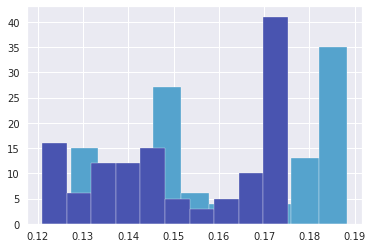

In [18]:
df_T = df.transpose()
df_T.iloc[1:-2, 0].hist()
df_T.iloc[1:-1, -1].hist()
df_T.head()

#### Create PCA

In [18]:
X_preprocess_pca = np.array(X_preprocess)
X_pca = np.array(X)
X_features = preprocessing.create_features(X_preprocess, n_subsets=26, mode='stats')
X_pca_features = np.array(X_features)
# y = pd.get_dummies(df['y'], drop_first=True).values.flatten()

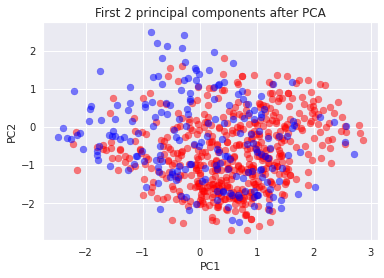

In [15]:
feature_selection.create_pca(X_pca_features, y, n_components=2)

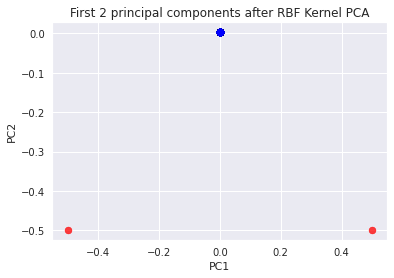

In [16]:
feature_selection.create_kpca(X_pca_features, y, n_components=2, gamma=16.0)

#### T-SNE

In [24]:
from sklearn.manifold import TSNE

In [20]:
df_preprocess['classe'] = df_preprocess['classe'].map({'Non-Cancer': 'Não-Câncer', 'Cancer': 'Câncer'})

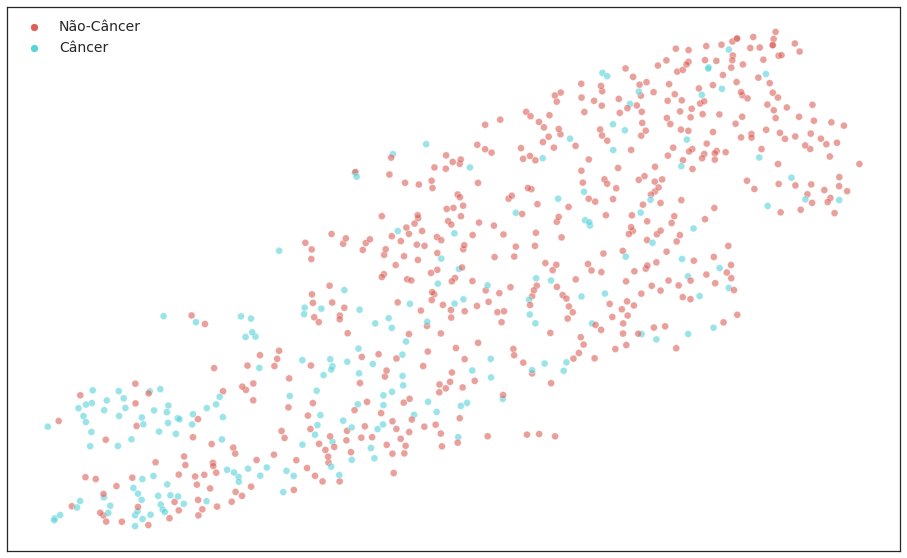

In [25]:
perplex = [60]
for p in perplex:
    tsne_results = TSNE(n_components=2, perplexity=p, learning_rate='auto', n_iter=5000).fit_transform(X_pca)

    X['TSNE-1'] = tsne_results[:,0]
    X['TSNE-2'] = tsne_results[:,1]
    X[' '] = df_preprocess['classe'].values
    plt.figure(figsize=(16,10))
    ax = sns.scatterplot(
        x="TSNE-1", y="TSNE-2",
        hue=" ", palette=sns.color_palette("hls", 2),
        data=X, legend="full", alpha=0.6)
    ax.set(xlabel=None)
    ax.set(ylabel=None)
    ax.set(xticklabels=[])
    ax.set(yticklabels=[])
    plt.legend(prop={'size': 14})
    plt.savefig(f'tsne-raw-{p}.jpg')
    plt.show()

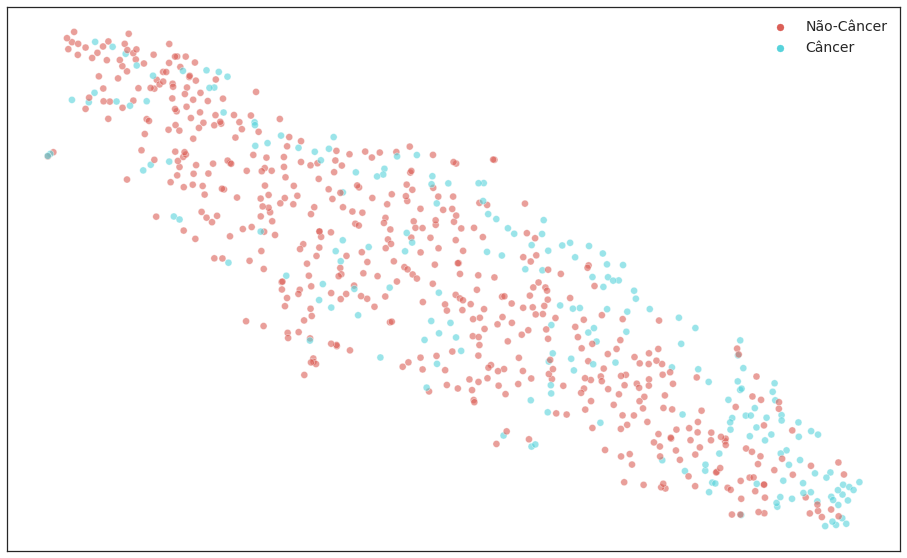

In [26]:
perplex = [60]
for p in perplex:
    tsne_results = TSNE(n_components=2, perplexity=p, learning_rate='auto', n_iter=5000).fit_transform(X_preprocess_pca)

    X_preprocess['TSNE-1'] = tsne_results[:,0]
    X_preprocess['TSNE-2'] = tsne_results[:,1]
    X_preprocess[' '] = df_preprocess['classe'].values
    plt.figure(figsize=(16,10))
    ax = sns.scatterplot(
        x="TSNE-1", y="TSNE-2",
        hue=" ", palette=sns.color_palette("hls", 2),
        data=X_preprocess, legend="full", alpha=0.6)
    ax.set(xlabel=None)
    ax.set(ylabel=None)
    ax.set(xticklabels=[])
    ax.set(yticklabels=[])
    plt.legend(prop={'size': 14})
    plt.savefig(f'tsne-snv-{p}.jpg')

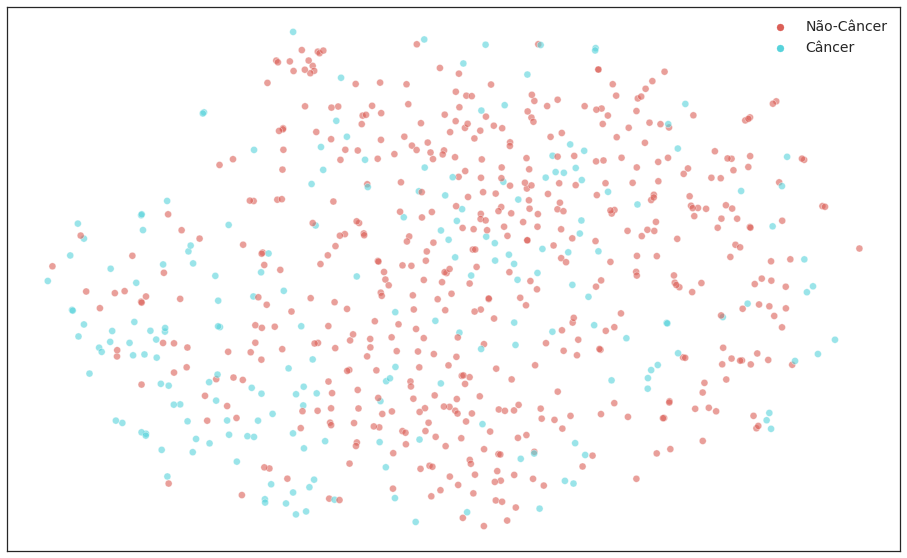

In [27]:
perplex = [50]
for p in perplex:
    tsne_results = TSNE(n_components=2, perplexity=p, learning_rate='auto', n_iter=5000).fit_transform(X_pca_features)

    X_features['TSNE-1'] = tsne_results[:,0]
    X_features['TSNE-2'] = tsne_results[:,1]
    X_features[' '] = df_preprocess['classe'].values
    plt.figure(figsize=(16,10))
    ax = sns.scatterplot(
        x="TSNE-1", y="TSNE-2",
        hue=" ", palette=sns.color_palette("hls", 2),
        data=X_features, legend="full", alpha=0.6)
    ax.set(xlabel=None)
    ax.set(ylabel=None)
    ax.set(xticklabels=[])
    ax.set(yticklabels=[])
    plt.legend(prop={'size': 14})
    plt.savefig(f'tsne-features-{p}.jpg')

#### Treinamento do Modelo nos dados

Sem pre-processamento

In [21]:
print('Sem pre-processamento\n')

model = CatBoostClassifier(verbose=0)

model, df_metrics_no_preprocess = fit_model_no_train_test(model, 
                                    X_train, X_test, 
                                    y_train, y_test, 
                                    method='NoPreprocessing')

Sem pre-processamento

ACCURACY: 0.723
BALANCED ACCURACY 0.625
F-SCORE: 0.436
PRECISION: 0.733
RECALL: 0.31
AUC ROC: 0.625


Com SNV

In [56]:
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

print('SNV')

model = CatBoostClassifier(verbose=0)

model, df_metrics_snv = fit_model_no_train_test(model, 
                                    X_snv_train, X_snv_test, 
                                    y_train, y_test, method='SNV')

SNV
ACCURACY: 0.815
BALANCED ACCURACY 0.743
F-SCORE: 0.651
PRECISION: 0.794
RECALL: 0.551
AUC ROC: 0.743


Feature engeneering

In [17]:
X_features = preprocessing.create_features(X, n_subsets=10, mode='freq')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

model = CatBoostClassifier(verbose=0)

model, df_metrics_features = fit_model(model, X_features, y, method='Features')

ACCURACY: 0.809
BALANCED ACCURACY 0.744
F-SCORE: 0.651
PRECISION: 0.757
RECALL: 0.571
AUC ROC: 0.744


SNV + Feature engeneering

In [18]:
X_features = preprocessing.create_features(X_snv, n_subsets=10, mode='freq')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

model = CatBoostClassifier(verbose=0)

model, df_metrics_snv_features = fit_model(model, X_features, y, method='SNV_Features')

ACCURACY: 0.796
BALANCED ACCURACY 0.724
F-SCORE: 0.619
PRECISION: 0.743
RECALL: 0.531
AUC ROC: 0.724


Junçao preprocessing

In [19]:
df_metrics_processing = pd.concat([df_metrics_features, 
                                   df_metrics_snv_features], axis=1)
df_metrics_processing.style.background_gradient('Blues', axis=1)

,Features,SNV_Features
ACCURACY,0.809000,0.796000
BALANCED ACCURACY,0.744000,0.724000
F-SCORE,0.651000,0.619000
PRECISION,0.757000,0.743000
RECALL,0.571000,0.531000
AUC ROC,0.744000,0.724000


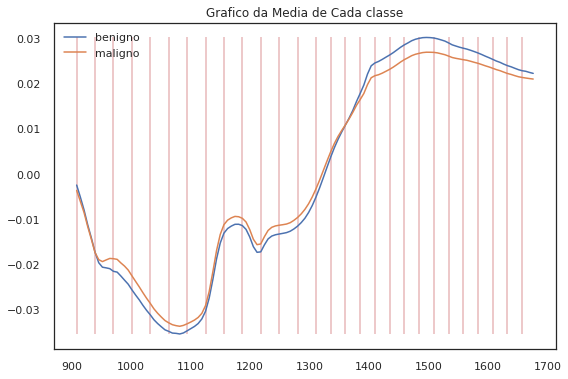

In [47]:
plot_graphs.plot_mean_labels(df_preprocess, "label", n_subsets=28)

In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1066, stratify=y)

model = CatBoostClassifier(verbose=0, eval_metric='F1', iterations=200)

model.fit(X_train, y_train, eval_set=(X_test, y_test), plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [50]:
from sklearn.model_selection import cross_val_score, KFold, StratifiedKFold

kfold = StratifiedKFold(n_splits=10, shuffle=True)
model = train.simple_catboost()
f1 = cross_val_score(model, X, y, cv=kfold, scoring='f1', n_jobs=-1).mean()
print("F1", f1)

F1 0.6504940099609637


#### SMOTE + preprocessing

SMOTE + Features Stats

In [ ]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)

In [ ]:
X_features_train = preprocessing.create_features(X_res, n_subsets=10, mode='stats')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='stats')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_stats = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_Features_stats')

ACCURACY: 0.828
BALANCED ACCURACY 0.825
F-SCORE: 0.748
PRECISION: 0.69
RECALL: 0.816
AUC ROC: 0.825


SMOTE + Features Freq

In [ ]:
X_features_train = preprocessing.create_features(X_res, n_subsets=10, mode='freq')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='freq')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_freq = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_Features_freq')

ACCURACY: 0.726
BALANCED ACCURACY 0.606
F-SCORE: 0.394
PRECISION: 0.636
RECALL: 0.286
AUC ROC: 0.606


SMOTE + Features All

In [ ]:
X_features_train = preprocessing.create_features(X_res, n_subsets=10, mode='all')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='all')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_all = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_Features_all')

ACCURACY: 0.822
BALANCED ACCURACY 0.803
F-SCORE: 0.725
PRECISION: 0.698
RECALL: 0.755
AUC ROC: 0.803


Join all

In [ ]:
df_metrics_SMOTE_processing = pd.concat([df_metrics_smote_features_stats, 
                                        df_metrics_smote_features_freq, 
                                        df_metrics_smote_features_all], axis=1)
df_metrics_SMOTE_processing.style.background_gradient('Blues', axis=1)

,SMOTE_Features_stats,SMOTE_Features_freq,SMOTE_Features_all
ACCURACY,0.828000,0.726000,0.822000
BALANCED ACCURACY,0.825000,0.606000,0.803000
F-SCORE,0.748000,0.394000,0.725000
PRECISION,0.690000,0.636000,0.698000
RECALL,0.816000,0.286000,0.755000
AUC ROC,0.825000,0.606000,0.803000


SMOTE + SNV + Features Stats

In [ ]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)

In [ ]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='stats')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_stats = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_SNV_Features_stats')

ACCURACY: 0.841
BALANCED ACCURACY 0.84
F-SCORE: 0.766
PRECISION: 0.707
RECALL: 0.837
AUC ROC: 0.84


SMOTE + SNV + Features Freq

In [ ]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='freq')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='freq')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_freq = fit_model_no_train_test(model,
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_SNV_Features_freq')

ACCURACY: 0.662
BALANCED ACCURACY 0.526
F-SCORE: 0.232
PRECISION: 0.4
RECALL: 0.163
AUC ROC: 0.526


SMOTE + Features All

In [ ]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='all')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='all')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_all = fit_model_no_train_test(model, 
                                                            X_features_train, X_features_test, 
                                                            y_res, y_test, method='SMOTE_SNV_Features_all')

ACCURACY: 0.803
BALANCED ACCURACY 0.756
F-SCORE: 0.667
PRECISION: 0.705
RECALL: 0.633
AUC ROC: 0.756


Join all

In [ ]:
df_metrics_SMOTE_processing = pd.concat([df_metrics_smote_features_stats, 
                                        df_metrics_smote_features_freq, 
                                        df_metrics_smote_features_all], axis=1)
df_metrics_SMOTE_processing.style.background_gradient('Blues', axis=1)

,SMOTE_SNV_Features_stats,SMOTE_SNV_Features_freq,SMOTE_SNV_Features_all
ACCURACY,0.841000,0.662000,0.803000
BALANCED ACCURACY,0.840000,0.526000,0.756000
F-SCORE,0.766000,0.232000,0.667000
PRECISION,0.707000,0.400000,0.705000
RECALL,0.837000,0.163000,0.633000
AUC ROC,0.840000,0.526000,0.756000


SMOTE + Features Stats

In [20]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)

In [39]:
X_features_train = preprocessing.create_features(X_res, n_subsets=10, mode='stats')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='stats')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_stats = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_Features_stats')

ACCURACY: 0.828
BALANCED ACCURACY 0.825
F-SCORE: 0.748
PRECISION: 0.69
RECALL: 0.816
AUC ROC: 0.825


SMOTE + Features Freq

In [36]:
X_features_train = preprocessing.create_features(X_res, n_subsets=10, mode='freq')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='freq')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_freq = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_Features_freq')

ACCURACY: 0.726
BALANCED ACCURACY 0.606
F-SCORE: 0.394
PRECISION: 0.636
RECALL: 0.286
AUC ROC: 0.606


SMOTE + Features All

In [37]:
X_features_train = preprocessing.create_features(X_res, n_subsets=10, mode='all')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='all')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_all = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_Features_all')

ACCURACY: 0.822
BALANCED ACCURACY 0.803
F-SCORE: 0.725
PRECISION: 0.698
RECALL: 0.755
AUC ROC: 0.803


Join all

In [40]:
df_metrics_SMOTE_processing = pd.concat([df_metrics_smote_features_stats, 
                                        df_metrics_smote_features_freq, 
                                        df_metrics_smote_features_all], axis=1)
df_metrics_SMOTE_processing.style.background_gradient('Blues', axis=1)

,SMOTE_Features_stats,SMOTE_Features_freq,SMOTE_Features_all
ACCURACY,0.828000,0.726000,0.822000
BALANCED ACCURACY,0.825000,0.606000,0.803000
F-SCORE,0.748000,0.394000,0.725000
PRECISION,0.690000,0.636000,0.698000
RECALL,0.816000,0.286000,0.755000
AUC ROC,0.825000,0.606000,0.803000


SMOTE + SNV + Features Stats

In [42]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)

In [47]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='stats')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_stats = fit_model_no_train_test(model, 
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_SNV_Features_stats')

ACCURACY: 0.841
BALANCED ACCURACY 0.84
F-SCORE: 0.766
PRECISION: 0.707
RECALL: 0.837
AUC ROC: 0.84


SMOTE + SNV + Features Freq

In [48]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='freq')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='freq')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_freq = fit_model_no_train_test(model,
                                                           X_features_train, X_features_test, 
                                                           y_res, y_test, method='SMOTE_SNV_Features_freq')

ACCURACY: 0.662
BALANCED ACCURACY 0.526
F-SCORE: 0.232
PRECISION: 0.4
RECALL: 0.163
AUC ROC: 0.526


SMOTE + Features All

In [49]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='all')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='all')

model = CatBoostClassifier(verbose=0)

model, df_metrics_smote_features_all = fit_model_no_train_test(model, 
                                                            X_features_train, X_features_test, 
                                                            y_res, y_test, method='SMOTE_SNV_Features_all')

ACCURACY: 0.803
BALANCED ACCURACY 0.756
F-SCORE: 0.667
PRECISION: 0.705
RECALL: 0.633
AUC ROC: 0.756


Join all

In [50]:
df_metrics_SMOTE_processing = pd.concat([df_metrics_smote_features_stats, 
                                        df_metrics_smote_features_freq, 
                                        df_metrics_smote_features_all], axis=1)
df_metrics_SMOTE_processing.style.background_gradient('Blues', axis=1)

,SMOTE_SNV_Features_stats,SMOTE_SNV_Features_freq,SMOTE_SNV_Features_all
ACCURACY,0.841000,0.662000,0.803000
BALANCED ACCURACY,0.840000,0.526000,0.756000
F-SCORE,0.766000,0.232000,0.667000
PRECISION,0.707000,0.400000,0.705000
RECALL,0.837000,0.163000,0.633000
AUC ROC,0.840000,0.526000,0.756000


#### Best solution: SMOTE + SNV + Stat Features

In [7]:
sm = SMOTE(random_state=1066)

X_res, y_res = sm.fit_resample(X_train, y_train)

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26, mode='stats')

In [18]:
# Catboost


params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

model = CatBoostClassifier(**params)

model, df_metrics_catboost = fit_model_no_train_test(model, 
                                                    X_features_train, X_features_test, 
                                                    y_res, y_test, method='CatBoost')

ACCURACY: 0.851
BALANCED ACCURACY 0.825
F-SCORE: 0.756
PRECISION: 0.75
RECALL: 0.761
AUC ROC: 0.825


In [8]:
# XGBoost

params = {
    "objective": "binary:logistic",
    'scale_pos_weight': 1, 
    'max_depth': 3, 
    'n_estimators': 46, 
    'learning_rate': 0.14088407196771763, 
    'colsample_bytree': 0.564389402764745, 
    'subsample': 0.9998513554687417, 
    'reg_alpha': 0, 
    'reg_lambda': 2
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
                                                    X_features_train, X_features_test, 
                                                    y_train, y_test, method='XGBOOST')

ACCURACY: 0.805
BALANCED ACCURACY 0.705
F-SCORE: 0.58
PRECISION: 0.744
RECALL: 0.475
AUC ROC: 0.705


In [20]:
# LGBM

model = LGBMClassifier()

model, df_metrics_lgbm = fit_model_no_train_test(model, 
                                                X_features_train, X_features_test, 
                                                y_res, y_test, method='LGBM')

ACCURACY: 0.814
BALANCED ACCURACY 0.778
F-SCORE: 0.692
PRECISION: 0.697
RECALL: 0.687
AUC ROC: 0.778


In [21]:
df_metrics_models = pd.concat([df_metrics_catboost, 
                                df_metrics_xgboost, 
                                df_metrics_lgbm], axis=1)
df_metrics_models.style.background_gradient('Blues', axis=1)

,CatBoost,XGBOOST,LGBM
ACCURACY,0.851000,0.801000,0.814000
BALANCED ACCURACY,0.825000,0.777000,0.778000
F-SCORE,0.756000,0.686000,0.692000
PRECISION,0.750000,0.658000,0.697000
RECALL,0.761000,0.716000,0.687000
AUC ROC,0.825000,0.777000,0.778000


#### Model comparisson

In [58]:
sm = SMOTE(random_state=1066)

X_res, y_res = sm.fit_resample(X_train, y_train)

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26, mode='stats')

Raw Dataset

In [59]:
# Catboost

params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

model = CatBoostClassifier(**params)

model, df_metrics_catboost = fit_model_no_train_test(model, 
                                                    X_train, X_test, 
                                                    y_train, y_test, method='CatBoost')

ACCURACY: 0.757
BALANCED ACCURACY 0.666
F-SCORE: 0.521
PRECISION: 0.658
RECALL: 0.431
AUC ROC: 0.666


In [60]:
# XGBoost

params = {
    "objective": "binary:logistic",
    'scale_pos_weight': 1, 
    'max_depth': 3, 
    'n_estimators': 46, 
    'learning_rate': 0.14088407196771763, 
    'colsample_bytree': 0.564389402764745, 
    'subsample': 0.9998513554687417, 
    'reg_alpha': 0, 
    'reg_lambda': 2
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
                                                    X_train, X_test, 
                                                    y_train, y_test, method='XGBOOST')

ACCURACY: 0.751
BALANCED ACCURACY 0.672
F-SCORE: 0.535
PRECISION: 0.628
RECALL: 0.466
AUC ROC: 0.672


In [61]:
# LGBM

params = {
    "scale_pos_weight": 1,
    "n_estimators": 97,
    "learning_rate": 0.11011626908250516,
    "num_leaves": 1940,
    "max_depth": 10,
    }

model = LGBMClassifier(**params)

model, df_metrics_lgbm = fit_model_no_train_test(model, 
                                                X_train, X_test, 
                                                y_train, y_test, method='LGBM')

ACCURACY: 0.751
BALANCED ACCURACY 0.681
F-SCORE: 0.552
PRECISION: 0.617
RECALL: 0.5
AUC ROC: 0.681


In [37]:
# PLS DA
from sklearn.cross_decomposition import PLSRegression

model = PLSRegression(n_components=2)

model.fit(X_train, y_train)
preds = model.predict(X_test)[:, 0]
binary_prediction = (model.predict(X_test)[:,0] > 0.5).astype('uint8')

print('ACC:', accuracy_score(y_test, binary_prediction))
print('BALANCED ACC:', balanced_accuracy_score(y_test, binary_prediction))
print('F1:', f1_score(y_test, binary_prediction))
print('PRECISION:', precision_score(y_test, binary_prediction))
print('RECALL:', recall_score(y_test, binary_prediction))
print('AUC:', roc_auc_score(y_test, binary_prediction))

ACC: 0.7395348837209302
BALANCED ACC: 0.5657334468809879
F1: 0.2631578947368421
PRECISION: 0.6666666666666666
RECALL: 0.16393442622950818
AUC: 0.5657334468809878


In [38]:
# SVC
from sklearn.svm import SVC

model = SVC()

model, df_metrics_svc = fit_model_no_train_test(model, 
                                                X_train, X_test, 
                                                y_train, y_test, method='SVC')

ACCURACY: 0.744
BALANCED ACCURACY 0.559
F-SCORE: 0.225
PRECISION: 0.8
RECALL: 0.131
AUC ROC: 0.559


In [39]:
df_metrics_models = pd.concat([
    df_metrics_catboost, 
    df_metrics_xgboost, 
    df_metrics_lgbm,
    df_metrics_svc
    ], axis=1)
    
df_metrics_models.style.background_gradient('Blues', axis=1)

,CatBoost,XGBOOST,LGBM,SVC
ACCURACY,0.749000,0.767000,0.781000,0.744000
BALANCED ACCURACY,0.632000,0.655000,0.689000,0.559000
F-SCORE,0.449000,0.490000,0.552000,0.225000
PRECISION,0.595000,0.649000,0.659000,0.800000
RECALL,0.361000,0.393000,0.475000,0.131000
AUC ROC,0.632000,0.655000,0.689000,0.559000


SMOTE Dataset

In [40]:
# Catboost

params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

model = CatBoostClassifier(**params)

model, df_metrics_catboost = fit_model_no_train_test(model, 
                                                    X_res, X_test, 
                                                    y_res, y_test, method='CatBoost')

ACCURACY: 0.67
BALANCED ACCURACY 0.611
F-SCORE: 0.45
PRECISION: 0.426
RECALL: 0.475
AUC ROC: 0.611


In [41]:
# XGBoost

params = {
    "objective": "binary:logistic",
    'scale_pos_weight': 1, 
    'max_depth': 3, 
    'n_estimators': 46, 
    'learning_rate': 0.14088407196771763, 
    'colsample_bytree': 0.564389402764745, 
    'subsample': 0.9998513554687417, 
    'reg_alpha': 0, 
    'reg_lambda': 2
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
                                                    X_res, X_test, 
                                                    y_res, y_test, method='XGBOOST')

ACCURACY: 0.67
BALANCED ACCURACY 0.626
F-SCORE: 0.474
PRECISION: 0.432
RECALL: 0.525
AUC ROC: 0.626


In [42]:
# LGBM

params = {
    "scale_pos_weight": 1,
    "n_estimators": 97,
    "learning_rate": 0.11011626908250516,
    "num_leaves": 1940,
    "max_depth": 10,
    }

model = LGBMClassifier(**params)

model, df_metrics_lgbm = fit_model_no_train_test(model, 
                                                X_res, X_test, 
                                                y_res, y_test, method='LGBM')

ACCURACY: 0.688
BALANCED ACCURACY 0.629
F-SCORE: 0.472
PRECISION: 0.455
RECALL: 0.492
AUC ROC: 0.629


In [43]:
# PLS DA
from sklearn.cross_decomposition import PLSRegression

model = PLSRegression(n_components=2)

model.fit(X_res, y_res)
preds = model.predict(X_test)[:, 0]
binary_prediction = (model.predict(X_test)[:,0] > 0.5).astype('uint8')

print('ACC:', accuracy_score(y_test, binary_prediction))
print('BALANCED ACC:', balanced_accuracy_score(y_test, binary_prediction))
print('F1:', f1_score(y_test, binary_prediction))
print('PRECISION:', precision_score(y_test, binary_prediction))
print('RECALL:', recall_score(y_test, binary_prediction))
print('AUC:', roc_auc_score(y_test, binary_prediction))

ACC: 0.7116279069767442
BALANCED ACC: 0.6947519693421332
F1: 0.5633802816901409
PRECISION: 0.49382716049382713
RECALL: 0.6557377049180327
AUC: 0.6947519693421333


In [44]:
# SVC
from sklearn.svm import SVC

model = SVC()

model, df_metrics_svc = fit_model_no_train_test(model, 
                                                X_res, X_test, 
                                                y_res, y_test, method='SVC')

ACCURACY: 0.716
BALANCED ACCURACY 0.693
F-SCORE: 0.561
PRECISION: 0.5
RECALL: 0.639
AUC ROC: 0.693


In [45]:
df_metrics_models = pd.concat([
    df_metrics_catboost, 
    df_metrics_xgboost, 
    df_metrics_lgbm,
    df_metrics_svc
    ], axis=1)
    
df_metrics_models.style.background_gradient('Blues', axis=1)

,CatBoost,XGBOOST,LGBM,SVC
ACCURACY,0.670000,0.670000,0.688000,0.716000
BALANCED ACCURACY,0.611000,0.626000,0.629000,0.693000
F-SCORE,0.450000,0.474000,0.472000,0.561000
PRECISION,0.426000,0.432000,0.455000,0.500000
RECALL,0.475000,0.525000,0.492000,0.639000
AUC ROC,0.611000,0.626000,0.629000,0.693000


Com pre-processamento

In [62]:
# Catboost

params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

model = CatBoostClassifier(**params)

model, df_metrics_catboost = fit_model_no_train_test(model, 
                                                    X_features_train, X_features_test, 
                                                    y_res, y_test, method='CatBoost')

ACCURACY: 0.847
BALANCED ACCURACY 0.841
F-SCORE: 0.768
PRECISION: 0.716
RECALL: 0.828
AUC ROC: 0.841


In [63]:
# XGBoost

params = {
    "objective": "binary:logistic",
    'scale_pos_weight': 1, 
    'max_depth': 3, 
    'n_estimators': 46, 
    'learning_rate': 0.14088407196771763, 
    'colsample_bytree': 0.564389402764745, 
    'subsample': 0.9998513554687417, 
    'reg_alpha': 0, 
    'reg_lambda': 2
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
                                                    X_features_train, X_features_test, 
                                                    y_res, y_test, method='XGBOOST')

ACCURACY: 0.847
BALANCED ACCURACY 0.841
F-SCORE: 0.768
PRECISION: 0.716
RECALL: 0.828
AUC ROC: 0.841


In [64]:
# LGBM

params = {
    "scale_pos_weight": 1,
    "n_estimators": 97,
    "learning_rate": 0.11011626908250516,
    "num_leaves": 1940,
    "max_depth": 10,
    }

model = LGBMClassifier(**params)

model, df_metrics_lgbm = fit_model_no_train_test(model, 
                                                X_features_train, X_features_test, 
                                                y_res, y_test, method='LGBM')

ACCURACY: 0.841
BALANCED ACCURACY 0.837
F-SCORE: 0.762
PRECISION: 0.706
RECALL: 0.828
AUC ROC: 0.837


In [50]:
# PLS DA
from sklearn.cross_decomposition import PLSRegression

model = PLSRegression(n_components=2)

model.fit(X_features_train, y_res)
preds = model.predict(X_features_test)[:, 0]
binary_prediction = (model.predict(X_features_test)[:,0] > 0.5).astype('uint8')

print('ACC:', accuracy_score(y_test, binary_prediction))
print('BALANCED ACC:', balanced_accuracy_score(y_test, binary_prediction))
print('F1:', f1_score(y_test, binary_prediction))
print('PRECISION:', precision_score(y_test, binary_prediction))
print('RECALL:', recall_score(y_test, binary_prediction))
print('AUC:', roc_auc_score(y_test, binary_prediction))

ACC: 0.7488372093023256
BALANCED ACC: 0.7256759633808814
F1: 0.6029411764705882
PRECISION: 0.5466666666666666
RECALL: 0.6721311475409836
AUC: 0.7256759633808814


In [51]:
# SVC
from sklearn.svm import SVC

model = SVC()

model, df_metrics_svc = fit_model_no_train_test(model, 
                                                X_features_train, X_features_test, 
                                                y_res, y_test, method='SVC')

ACCURACY: 0.777
BALANCED ACCURACY 0.691
F-SCORE: 0.556
PRECISION: 0.638
RECALL: 0.492
AUC ROC: 0.691


In [52]:
df_metrics_models = pd.concat([
    df_metrics_catboost, 
    df_metrics_xgboost, 
    df_metrics_lgbm,
    df_metrics_svc
    ], axis=1)
    
df_metrics_models.style.background_gradient('Blues', axis=1)

,CatBoost,XGBOOST,LGBM,SVC
ACCURACY,0.800000,0.777000,0.786000,0.777000
BALANCED ACCURACY,0.747000,0.720000,0.712000,0.691000
F-SCORE,0.639000,0.600000,0.589000,0.556000
PRECISION,0.655000,0.610000,0.647000,0.638000
RECALL,0.623000,0.590000,0.541000,0.492000
AUC ROC,0.747000,0.720000,0.712000,0.691000


#### Features Selection

Raw Signal

In [27]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)
y_train, y_test = np.array(y_res), np.array(y_test)

new_cols = ['comp_'+str(exp) for exp in X_res.columns]
X_res.columns = new_cols
X_test.columns = new_cols

In [22]:
# param_grid = {
#     'learning_rate': [0.2, 0.1],
#     'num_leaves': [25, 35],
#     'max_depth': [10, 12]
# }

# search = RandomizedSearchCV(clf_lgbm, param_grid)

clf_lgbm = LGBMClassifier(max_depth=5,
                         n_estimators=200, 
                         verbose=0)

In [23]:
shap_elimination = ShapRFECV(
    clf=clf_lgbm, step=0.2, cv=10, scoring='f1', n_jobs=3)
report = shap_elimination.fit_compute(X_res, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001100 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning]

In [24]:
#First 5 rows of first 5 columns
report[['num_features', 'features_set', 'val_metric_mean']]

,num_features,features_set,val_metric_mean
1,125,"[comp_908.1, comp_914.294, comp_920.489, comp_...",0.788
2,100,"[comp_1490.369, comp_1168.263, comp_1335.51, c...",0.794
3,80,"[comp_1490.369, comp_1168.263, comp_1335.51, c...",0.785
4,64,"[comp_1490.369, comp_1335.51, comp_1224.012, c...",0.796
5,52,"[comp_1490.369, comp_1335.51, comp_1224.012, c...",0.797
6,42,"[comp_1490.369, comp_1676.2, comp_1013.404, co...",0.798
7,34,"[comp_1490.369, comp_1676.2, comp_1013.404, co...",0.805
8,28,"[comp_1490.369, comp_1676.2, comp_1013.404, co...",0.813
9,23,"[comp_1490.369, comp_1211.623, comp_1013.404, ...",0.821
10,19,"[comp_1490.369, comp_1211.623, comp_1013.404, ...",0.800


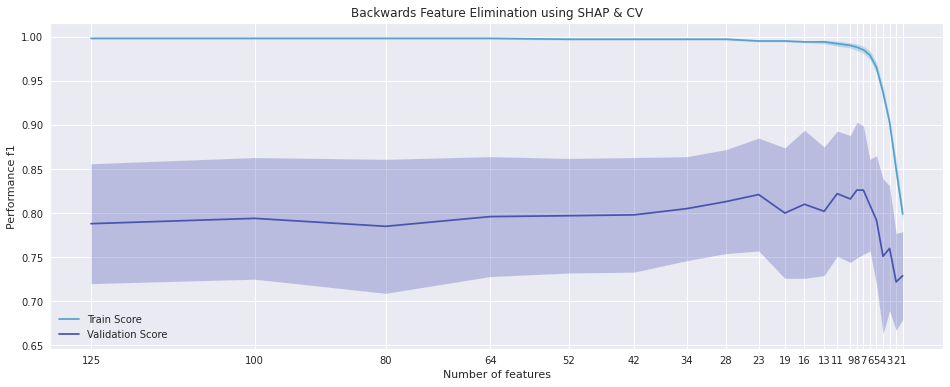

In [25]:
performance_plot = shap_elimination.plot(figsize=(16, 6))

In [30]:
# take best feature set

features = report.sort_values(by='val_metric_mean', ascending=False)['features_set'].to_list()[0]
X_train_selected = X_res[features]
X_test_selected = X_test[features]

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train_selected), columns=X_train_selected.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test_selected), columns=X_test_selected.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26, mode='stats')

params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

cb = CatBoostClassifier(**params)

model, df_metrics_raw = fit_model_no_train_test(cb, 
                                            X_features_train, X_features_test, 
                                            y_train, y_test, 
                                            method='Raw Data')

ACCURACY: 0.858
BALANCED ACCURACY 0.852
F-SCORE: 0.796
PRECISION: 0.763
RECALL: 0.833
AUC ROC: 0.852


Features

In [5]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)
y_train, y_test = np.array(y_res), np.array(y_test)

new_cols = ['comp_'+str(exp) for exp in X_res.columns]
X_res.columns = new_cols

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26, mode='stats')

In [6]:
# param_grid = {
#     'learning_rate': [0.2, 0.1],
#     'num_leaves': [25, 35],
#     'max_depth': [10, 12]
# }

clf_lgbm = LGBMClassifier(max_depth=5,
                         n_estimators=200,
                         num_leaves=35,
                         learning_rate=0.1,
                         verbose=0)

# search = RandomizedSearchCV(clf_lgbm, param_grid)

In [7]:
shap_elimination = ShapRFECV(
    clf=clf_lgbm, step=0.2, cv=10, scoring='f1', n_jobs=3)
report = shap_elimination.fit_compute(X_features_train, y_train)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002785 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002868 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning]

In [8]:
#First 5 rows of first 5 columns
report[['num_features', 'features_set', 'val_metric_mean']]

,num_features,features_set,val_metric_mean
1,312,"[mean_subset1, std_subset1, median_subset1, ku...",0.891
2,250,"[median_subset14, kurtosis_subset7, max_subset...",0.890
3,200,"[median_subset14, rms_subset17, std_subset2, c...",0.880
4,160,"[median_subset14, crest_factor_subset20, std_s...",0.892
5,128,"[std_subset2, crest_factor_subset20, mean_subs...",0.895
6,103,"[std_subset2, crest_factor_subset20, mean_subs...",0.894
7,83,"[std_subset2, kurtosis_subset3, crest_factor_s...",0.903
8,67,"[std_subset2, kurtosis_subset3, crest_factor_s...",0.907
9,54,"[std_subset2, crest_factor_subset20, kurtosis_...",0.895
10,44,"[std_subset2, skew_subset18, crest_factor_subs...",0.898


In [19]:
# take best feature set

features = report.sort_values(by='val_metric_mean', ascending=False)['features_set'].to_list()[0]
X_train_selected = X_features_train[features]
X_test_selected = X_features_test[features]

params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

cb = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(cb, 
                                            X_train_selected, X_test_selected, 
                                            y_train, y_test, 
                                            method='No process selected')

ACCURACY: 0.833
BALANCED ACCURACY 0.838
F-SCORE: 0.773
PRECISION: 0.708
RECALL: 0.852
AUC ROC: 0.838


<Figure size 864x576 with 0 Axes>

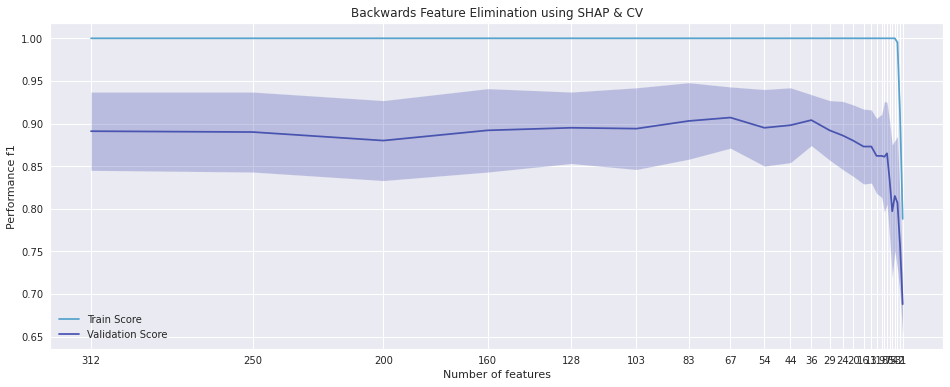

In [12]:
performance_plot = shap_elimination.plot(figsize=(16, 6))

#### Features Importance

In [19]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)
y_train, y_test = np.array(y_res), np.array(y_test)

new_cols = ['comp_'+str(exp) for exp in X_res.columns]
X_res.columns = new_cols

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26, mode='stats')

model = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=3)
model.fit(X_res, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [21]:
explainer = shap.Explainer(model)
shap_values = explainer(X_res)

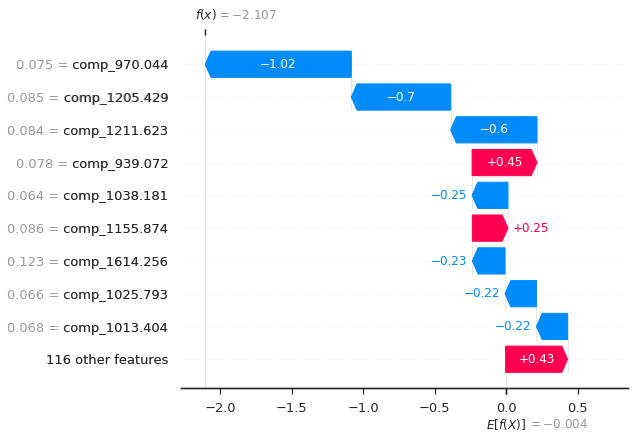

In [22]:
# visualize the first prediction's explanation
shap.plots.waterfall(shap_values[0])

In [23]:
shap.initjs()
sns.set(style="white", color_codes=True)

shap.plots.force(shap_values[0])

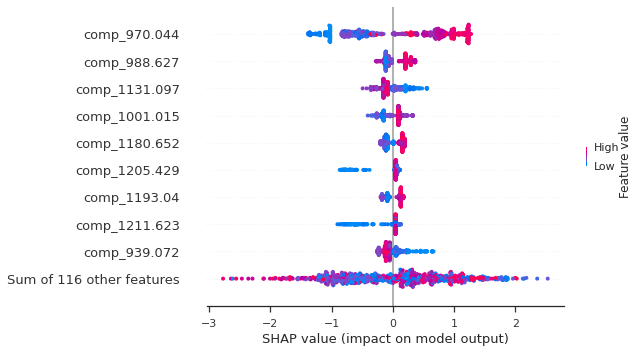

In [24]:
# summarize the effects of all the features
shap.initjs()
shap.plots.beeswarm(shap_values)

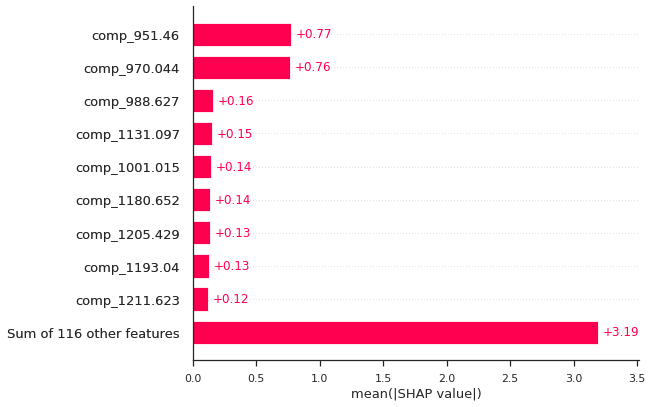

In [25]:
shap.initjs()
shap.plots.bar(shap_values)

#### Create SHAP for windows

In [22]:
sm = SMOTE(random_state=1066)

X = df.drop(['label'], axis=1).set_index('Sample')
y = pd.get_dummies(df.label, drop_first=True)['maligno'].to_list()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

sintetic = load_dataset(path="../data/PAD_2022.xlsx", sheet="Sintetica") \
    .drop(['Classe', 'Biopsias', 'COD'], axis=1).set_index('Sample')
X_train = pd.concat([X_train, sintetic])
y_train = np.append(y_train, [1 for _ in range(len(sintetic))])

X_res, y_res = sm.fit_resample(X_train, y_train)
y_train, y_test = np.array(y_res), np.array(y_test)

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26)
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26)

Best window mean

In [18]:
def create_features_means(X, n_subsets):
    """
    Create a Dataframe of features of signal, given a number of subdivisions of the amplitudes
    """
    all_cols = np.array(X.columns)
    splits = np.array_split(all_cols, n_subsets)
    # print(splits)
    df_features = pd.DataFrame()
    for subset, vals in zip(range(1, n_subsets+1), splits):
        means = []
        df_sub = X[vals]

        for idx, row in df_sub.iterrows():
            means.append(np.mean(row.values))

        df_temp = pd.DataFrame({    
                                f"Média {int(vals[0])} até {int(vals[-1])}": means
                                })
        df_features = pd.concat([df_features, df_temp], axis=1)
    return df_features


X_means_train = create_features_means(X_snv_train, n_subsets=26)
X_means_test = create_features_means(X_snv_test, n_subsets=26)

params = {
    'scale_pos_weight': 1,
    'n_estimators': 94,
    'learning_rate': 0.07413532971822273,
    'num_leaves': 3380,
    'max_depth': 3,
    }

model = LGBMClassifier(**params)
model.fit(X_means_train, y_train)

# explainer = shap.Explainer(model)
# shap_values = explainer(X_means_train)

# shap.initjs()
# shap.plots.beeswarm(shap_values, max_display=40)

LGBMClassifier(learning_rate=0.07413532971822273, max_depth=3, n_estimators=94,
               num_leaves=3380, scale_pos_weight=1)

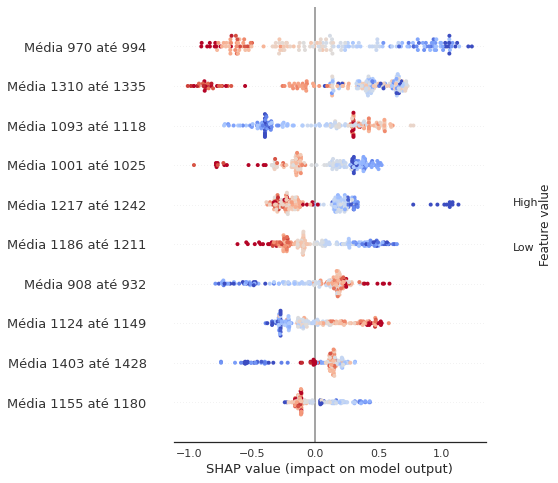

In [19]:
exp = shap.TreeExplainer(model)
shap_values = exp.shap_values(X_means_test)
shapobj = exp(X_means_test)

sns.set_style("white")
# shap.initjs()
shap.summary_plot(np.take(shapobj.values, 0, axis=-1), 
                  X_means_test, max_display=10,
                  sort=True, show=False, cmap='coolwarm', 
                  plot_size=(7, 8))

plt.savefig('shap_means.jpg', dpi=300, bbox_inches='tight')

In [33]:
X_means_train = preprocessing.create_features_means(X_snv_train, n_subsets=26)
X_means_test = preprocessing.create_features_means(X_snv_test, n_subsets=26)

model = LGBMClassifier(max_depth=5,
                         n_estimators=200, 
                         verbose=0)

# params = {
#     'boosting_type': 'Plain',
#     'objective': 'Logloss',
#     'verbose': 0,
#     'used_ram_limit': '5gb',
#     'random_seed': 1066,
#     'max_depth': 10,
#     'l2_leaf_reg': 18,
#     'n_estimators': 181,
#     'rsm': 0.6376887014106808,
#     'learning_rate': 0.2063,
#     'eval_metric': 'F1'
# }

# model = CatBoostClassifier(**params)

shap_elimination = ShapRFECV(
    clf=model, step=0.2, cv=10, scoring='f1', n_jobs=3)
report = shap_elimination.fit_compute(X_means_train, y_train)

features = report.sort_values(by='val_metric_mean', ascending=False)['features_set'].to_list()[0]
X_train_selected = X_means_train[features]
X_test_selected = X_means_test[features]

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wis

In [34]:
report.sort_values(by='val_metric_mean', ascending=False).head(1)['eliminated_features'].values

array([list(['mean_subset2', 'mean_subset9'])], dtype=object)

In [31]:
# catboost drops
drop_matches = ['26', '25', '24', '6']
drop_cols = []

for match in drop_matches:
    for coluna in X_features_train.columns:
        if re.search(match, coluna):
            drop_cols.append(coluna)

X_features_train_drop = X_features_train.drop(drop_cols, axis=1)
X_features_test_drop = X_features_test.drop(drop_cols, axis=1)


params = {
    'boosting_type': 'Plain',
    'objective': 'Logloss',
    'verbose': 0,
    'used_ram_limit': '5gb',
    'random_seed': 1066,
    'max_depth': 10,
    'l2_leaf_reg': 18,
    'n_estimators': 181,
    'rsm': 0.6376887014106808,
    'learning_rate': 0.2063,
    'eval_metric': 'F1'
}

model = CatBoostClassifier(**params)
model, df_catboost = fit_model_no_train_test(model, X_features_train_drop, X_features_test_drop, y_train, y_test, method='Catboost Selection')

ACCURACY: 0.847
BALANCED ACCURACY 0.811
F-SCORE: 0.745
PRECISION: 0.778
RECALL: 0.714
AUC ROC: 0.811


In [37]:
# lightGBM drops
drop_matches = ['2', '9']
drop_cols = []

for match in drop_matches:
    for coluna in X_features_train.columns:
        if re.search(match, coluna):
            drop_cols.append(coluna)

X_features_train_drop = X_features_train.drop(drop_cols, axis=1)
X_features_test_drop = X_features_test.drop(drop_cols, axis=1)

model = LGBMClassifier(max_depth=5,
                         n_estimators=200, 
                         verbosity=0)

model, df_lgbm = fit_model_no_train_test(model, X_features_train_drop, X_features_test_drop, y_train, y_test, method='LGBM Selection')

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047967 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

Best statistical feature for each window

In [16]:
from scipy import stats

def create_features_stats(X, n_subsets):
    """
    Create a Dataframe of features of signal, given a number of subdivisions of the amplitudes
    """
    all_cols = np.array(X.columns)
    splits = np.array_split(all_cols, n_subsets)
    df_features = pd.DataFrame()
    for subset, vals in zip(range(1, n_subsets+1), splits):
        means = []; stds = []; medians = []; kurts = []; skews = []; maxs = []; mins = []
        peaks = []; rms = []; p2p = []; var = []; crest_factor = []
        df_sub = X[vals]

        for idx, row in df_sub.iterrows():
            means.append(np.mean(row.values))
            stds.append(np.std(row.values))
            medians.append(np.median(row.values))
            kurts.append(stats.kurtosis(row.values))
            skews.append(stats.skew(row.values))
            maxs.append(np.max(row.values))
            mins.append(np.min(row.values))
            peaks.append(np.max(np.abs(row.values)))
            rms.append(np.sqrt(np.mean(row.values**2)))
            p2p.append(np.ptp(row.values))
            var.append(np.var(row.values))
            crest_factor.append(np.max(np.abs(row.values))/np.sqrt(np.mean(row.values**2)))

            df_temp = pd.DataFrame({    
                                f"Média {int(vals[0])} até {int(vals[-1])}": means, 
                                f"Desvio padrão {int(vals[0])} até {int(vals[-1])}": stds,
                                f"Mediana {int(vals[0])} até {int(vals[-1])}": medians, 
                                f"Curtose {int(vals[0])} até {int(vals[-1])}": kurts,
                                f"Assimetria {int(vals[0])} até {int(vals[-1])}": skews, 
                                f"Máximo {int(vals[0])} até {int(vals[-1])}": maxs, 
                                f"Mínimo {int(vals[0])} até {int(vals[-1])}": mins,
                                f"Pico {int(vals[0])} até {int(vals[-1])}": peaks,
                                f"Pico a Pico {int(vals[0])} até {int(vals[-1])}": p2p,
                                f"Valor eficaz {int(vals[0])} até {int(vals[-1])}": rms, 
                                f"Variância {int(vals[0])} até {int(vals[-1])}": var, 
                                f"Fator de Crista {int(vals[0])} até {int(vals[-1])}": crest_factor
                                })
        df_features = pd.concat([df_features, df_temp], axis=1)
    return df_features

X_features_train = create_features_stats(X_snv_train, n_subsets=26)
X_features_test = create_features_stats(X_snv_test, n_subsets=26)

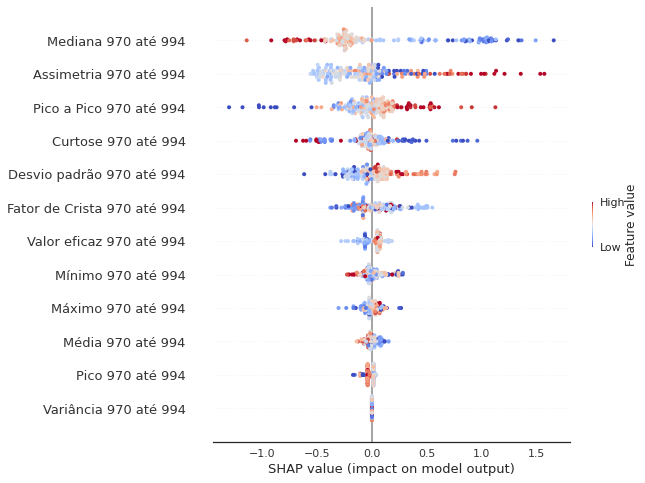

In [17]:
# i = 0
# while i+12 < len(X_features_train):
i = 24

X_window = X_features_train.iloc[:, i:i+12]
X_window_test = X_features_test.iloc[:, i:i+12]

params = {
    'scale_pos_weight': 1,
    'n_estimators': 94,
    'learning_rate': 0.07413532971822273,
    'num_leaves': 3380,
    'max_depth': 3,
    }

model = LGBMClassifier(**params)
model.fit(X_window, y_train)

# explainer = shap.Explainer(model)
# shap_values = explainer(X_window)

shap.initjs()
# shap.plots.beeswarm(shap_values, max_display=15)

exp = shap.TreeExplainer(model)
shap_values = exp.shap_values(X_window_test)
shapobj = exp(X_window_test)

shap.summary_plot(np.take(shapobj.values, 0, axis=-1), 
                X_window_test, max_display=15,
                sort=True, show=False, cmap='coolwarm', plot_size=(8, 8))
plt.savefig('shap_subseq_importance.jpg', dpi=300, bbox_inches='tight')
    # i += 12

#### Multiclass Classification

Load Data Multiclass

In [12]:
df_2021 = pd.concat([
    load_dataset(path="../data/PAD_2021.xlsx", sheet="SGPalha_2021"),
    load_dataset(path="../data/PAD_2021.xlsx", sheet="SMJetiba_2021"),
    load_dataset(path="../data/PAD_2021.xlsx", sheet="Itarana_2021"),
    ]).iloc[:, :-3]

df_2022 = pd.concat([
    load_dataset(path="../data/PAD_2022.xlsx", sheet="SMJetiba_2022"),
    load_dataset(path="../data/PAD_2022.xlsx", sheet="Vvalerio_2022"),
    load_dataset(path="../data/PAD_2022.xlsx", sheet="Bguandu_2022"),
    load_dataset(path="../data/PAD_2022.xlsx", sheet="Plaginha_2022"),
    load_dataset(path="../data/PAD_2022.xlsx", sheet="LdaTerra_2022"),
    load_dataset(path="../data/PAD_2022.xlsx", sheet="Sintetica")
    ])

df_full = pd.concat([df_2021, df_2022]).drop(['Amostras', 'Biopsias', 'COD'], axis=1)
df_mean = df_full.groupby('Sample', as_index=False).mean()
df_last = df_full.groupby('Sample', as_index=False).last()
df_mean['classe'] = df_last['Classe']
df_multiclass = df_mean.copy()

In [15]:
show_abs_values(df_multiclass, 'classe')

,values,%
ACK,287,44.36
CBC,150,23.18
SEK,110,17.00
CEC,38,5.87
NEV,36,5.56
MEL,26,4.02


Melhor modelo - Catboost com SNV + 26 Stats Features

In [14]:
sm = SMOTE(k_neighbors=3, random_state=1066)
le = LabelEncoder()

X = df_multiclass.drop(['classe'], axis=1).set_index('Sample')
y = le.fit_transform(df_multiclass.classe)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, 
                                                    random_state=1066, stratify=y)

X_res, y_res = sm.fit_resample(X_train, y_train)

# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_res), columns=X.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=26, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=26, mode='stats')

In [16]:
X_res['y'] = y_res
show_abs_values(X_res, 'y')

,values,%
4,215,16.67
0,215,16.67
1,215,16.67
3,215,16.67
2,215,16.67
5,215,16.67


In [17]:
model = CatBoostClassifier(loss_function='MultiClass', verbose=0, iterations=200)

model, df_metrics_multiclass = fit_model_multiclass_no_train_test(model, 
                                           X_features_train, X_features_test, 
                                           y_res, y_test, method='CatBoostMulticlass')

display(df_metrics_multiclass)

ACCURACY: 0.722
BALANCED ACCURACY 0.608
F-SCORE: 0.621
PRECISION: 0.664
RECALL: 0.608


,CatBoostMulticlass
ACCURACY,0.722
BALANCED ACCURACY,0.608
F-SCORE,0.621
PRECISION,0.664
RECALL,0.608


#### Random Generated Data + preprocessing

In [ ]:
# generate
# 17 certatoses seborreica
# 65 carcinoma espinocelular
# 75 nevo
# 96 melanoma
# media + std * rand(0, 1)

df_train, df_test = train_test_split(df_mean, test_size=0.25, stratify=df_mean['classe'].to_list())

df_train_gen = generate_data(df_train, 'SEK', 'benigno', 17)
df_train_gen = generate_data(df_train_gen, 'NEV', 'benigno', 75)
df_train_gen = generate_data(df_train_gen, 'CEC', 'maligno', 65)
df_train_gen = generate_data(df_train_gen, 'MEL', 'maligno', 96)

show_abs_values(df_train_gen, 'label')

,values,%
benigno,416,57.54
maligno,307,42.46


In [ ]:
X_train = df_train_gen.drop(['Sample', 'classe', 'label'], axis=1)
y_train = pd.get_dummies(df_train_gen.label, drop_first=True)['maligno'].to_list()

X_test = df_test.drop(['Sample', 'classe', 'label'], axis=1)
y_test = pd.get_dummies(df_test.label, drop_first=True)['maligno'].to_list()

print('Random Generated Data\n')

Random Generated Data



RGD + Features Stat

In [ ]:
X_features_train = preprocessing.create_features(X_train, n_subsets=10, mode='stats')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='stats')

model = CatBoostClassifier(verbose=0)

model, df_metrics_rgd_stats = fit_model_no_train_test(model, X_features_train, X_features_test, 
                                                          y_train, y_test, method='RGD_Features_stats')

ACCURACY: 0.822
BALANCED ACCURACY 0.755
F-SCORE: 0.667
PRECISION: 0.778
RECALL: 0.583
AUC ROC: 0.755


RGD + Features Freq

In [ ]:
X_features_train = preprocessing.create_features(X_train, n_subsets=10, mode='freq')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='freq')

model = CatBoostClassifier(verbose=0)

model, df_metrics_rgd_freq = fit_model_no_train_test(model, X_features_train, X_features_test, 
                                                          y_train, y_test, method='RGD_Features_freq')

ACCURACY: 0.752
BALANCED ACCURACY 0.611
F-SCORE: 0.381
PRECISION: 0.8
RECALL: 0.25
AUC ROC: 0.611


RGD + Features All

In [ ]:
X_features_train = preprocessing.create_features(X_train, n_subsets=10, mode='all')
X_features_test = preprocessing.create_features(X_test, n_subsets=10, mode='all')

model = CatBoostClassifier(verbose=0)

model, df_metrics_rgd_all = fit_model_no_train_test(model, X_features_train, X_features_test, 
                                                          y_train, y_test, method='RGD_Features_all')

ACCURACY: 0.815
BALANCED ACCURACY 0.727
F-SCORE: 0.623
PRECISION: 0.828
RECALL: 0.5
AUC ROC: 0.727


Join metrics

In [ ]:
df_metrics_RGD_processing = pd.concat([df_metrics_rgd_stats, 
                                        df_metrics_rgd_freq, 
                                        df_metrics_rgd_all], axis=1)
df_metrics_RGD_processing.style.background_gradient('Blues', axis=1)

,RGD_Features_stats,RGD_Features_freq,RGD_Features_all
ACCURACY,0.822000,0.752000,0.815000
BALANCED ACCURACY,0.755000,0.611000,0.727000
F-SCORE,0.667000,0.381000,0.623000
PRECISION,0.778000,0.800000,0.828000
RECALL,0.583000,0.250000,0.500000
AUC ROC,0.755000,0.611000,0.727000


RGD + SNV + Features stat

In [ ]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='stats')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='stats')

model = CatBoostClassifier(verbose=0)

model, df_metrics_rgd_stats = fit_model_no_train_test(model, X_features_train, X_features_test, 
                                                          y_train, y_test, method='RGD_SNV_Features_stats')

ACCURACY: 0.809
BALANCED ACCURACY 0.734
F-SCORE: 0.634
PRECISION: 0.765
RECALL: 0.542
AUC ROC: 0.734


RGD + SNV + Features freq

In [ ]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='freq')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='freq')

model = CatBoostClassifier(verbose=0)

model, df_metrics_rgd_freq = fit_model_no_train_test(model, X_features_train, X_features_test, 
                                                          y_train, y_test, method='RGD_SNV_Features_freq')

ACCURACY: 0.688
BALANCED ACCURACY 0.507
F-SCORE: 0.075
PRECISION: 0.4
RECALL: 0.042
AUC ROC: 0.507


RGD + SNV + Features all

In [ ]:
# SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

X_features_train = preprocessing.create_features(X_snv_train, n_subsets=10, mode='all')
X_features_test = preprocessing.create_features(X_snv_test, n_subsets=10, mode='all')

model = CatBoostClassifier(verbose=0)

model, df_metrics_rgd_all = fit_model_no_train_test(model, X_features_train, X_features_test, 
                                                          y_train, y_test, method='RGD_SNV_Features_all')

ACCURACY: 0.796
BALANCED ACCURACY 0.707
F-SCORE: 0.59
PRECISION: 0.767
RECALL: 0.479
AUC ROC: 0.707


Join metrics

In [ ]:
df_metrics_RGD_processing = pd.concat([df_metrics_rgd_stats, 
                                        df_metrics_rgd_freq, 
                                        df_metrics_rgd_all], axis=1)
df_metrics_RGD_processing.style.background_gradient('Blues', axis=1)

,RGD_SNV_Features_stats,RGD_SNV_Features_freq,RGD_SNV_Features_all
ACCURACY,0.809000,0.688000,0.796000
BALANCED ACCURACY,0.734000,0.507000,0.707000
F-SCORE,0.634000,0.075000,0.590000
PRECISION,0.765000,0.400000,0.767000
RECALL,0.542000,0.042000,0.479000
AUC ROC,0.734000,0.507000,0.707000
